TS Momentum in Cryptocurrencies

In [1]:
from datetime import datetime
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure

In [2]:
def compute_turnover(port):
    to = (port.fillna(0)-port.shift().fillna(0)).abs().sum(1)   
    return to

In [3]:
def compute_sharpe_ratio(rets):
    mean_rets = rets.mean()*252
    vol = rets.std()*np.sqrt(252)
    sharpe_ratio = mean_rets / vol
    return sharpe_ratio

In [4]:
def compute_stats(rets):
    stats={}
    stats['avg'] = rets.mean()*252
    stats['vol'] = rets.std()*np.sqrt(252)
    stats['sharpe'] = stats['avg']/stats['vol']
    stats['hit_rate'] = rets[rets>0].count() / rets.count()
    stats = pd.DataFrame(stats)
    return stats

In [5]:
def drawdown(px):
    return (px / (px.expanding(min_periods=1).max()) - 1)

In [6]:
from_pickle = pd.read_pickle('Reversal/CoinGecko_px_vol_1D.pkl')

In [7]:
price_columns = [col for col in from_pickle.columns if 'price' in col]
volume_columns = [col for col in from_pickle.columns if 'volume' in col]

crypto_px = from_pickle[price_columns]
crypto_vol = from_pickle[volume_columns]

crypto_px.columns = crypto_px.columns.droplevel(1)
crypto_vol.columns = crypto_vol.columns.droplevel(1)

In [8]:
crypto_px = crypto_px.loc['2018-01-01':]
crypto_px = crypto_px.drop(columns=['TUSD', 'DAI', 'WBTC', 'WETH', 'USDC', 'BSV'])

In [9]:
# Calculate the total number of data points for each coin
total_data_points = len(crypto_px)

# Calculate the number of non-NA/null entries for each coin
non_null_counts = crypto_px.notnull().sum()

# Calculate the threshold for 95% of data points
threshold = 0.90 * total_data_points

# Filter out coins with less than 95% of data points
crypto_px = crypto_px.loc[:, non_null_counts >= threshold]

crypto_px

,BTC,XRP,BNB,DOGE,ADA,TRX,LTC,LINK,BCH,EOS,...,UTK,PIVX,SYS,REQ,FUN,VIB,NULS,IDEX,MDT,BORG
Date,,,,,,,,,,,,,,,,,,,,,
2018-01-01,14093.606831,2.310120,8.828099,0.009091,0.747140,0.051654,230.462120,0.751033,2426.970077,7.672278,...,0.467207,10.689500,0.783623,0.867352,0.086325,0.455327,2.267259,NaN,NaN,NaN
2018-01-02,15321.932852,2.455290,9.090393,0.009335,0.807430,0.080893,255.048185,0.689388,2627.026940,9.504036,...,0.647065,11.555000,0.817777,0.809224,0.088933,0.464458,2.510494,NaN,NaN,NaN
2018-01-03,15583.885538,3.125710,9.886323,0.009592,1.075401,0.098107,248.042194,0.704623,2630.511811,10.090184,...,0.896774,10.923600,0.798803,0.795348,0.106564,0.584170,3.696732,NaN,NaN,NaN
2018-01-04,15976.365194,3.220050,9.675758,0.010098,1.179347,0.218139,244.834372,1.036826,2458.894372,11.713284,...,0.874131,10.581200,0.784280,0.826834,0.178514,0.698240,4.788923,NaN,NaN,NaN
2018-01-05,18336.922980,2.931380,16.488523,0.013841,1.077821,0.231673,254.138525,0.996575,2551.321685,9.673192,...,0.762206,9.951170,0.748309,0.761799,0.161191,0.585847,5.659994,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-12,58804.234500,0.552884,503.472306,0.100570,0.328140,0.127716,59.691360,10.012537,330.440521,0.467477,...,0.038229,0.193892,0.073564,0.090949,0.003115,0.057157,0.245821,0.032078,0.036722,0.170774
2024-08-13,59350.074333,0.568612,518.752217,0.107647,0.338874,0.126661,61.414267,10.561648,354.155288,0.500104,...,0.039951,0.204125,0.078151,0.094758,0.003233,0.058272,0.255234,0.033471,0.038736,0.168182
2024-08-14,60601.223178,0.576440,523.553455,0.106469,0.340317,0.128873,63.411783,10.577495,352.234629,0.507208,...,0.039211,0.203198,0.076065,0.094747,0.003273,0.058356,0.251570,0.033162,0.038288,0.171173


In [10]:
coins_ret = crypto_px / crypto_px.shift() -1

In [11]:
end_of_insample = pd.Timestamp('2021-12-31')
in_sample_ret = coins_ret.loc[:end_of_insample]

In [12]:
def generate_signals(ret, short_window, long_window, strategy_type):
    # Calculate short-term and long-term moving averages of returns
    short_ma = ret.rolling(short_window, min_periods=1).mean()
    long_ma = ret.rolling(long_window, min_periods=short_window).mean()

    if strategy_type == 'TS':
        # 1. The z-score of the past 10 day returns, and it tells us if a coin is doing better than it usually does.
        signal = np.sqrt(short_window) * (short_ma - long_ma)
        signal = signal / ret.rolling(long_window, min_periods=short_window).std()
        
        # 2. Pass the signal through a tanh function to curtail these
        port = np.tanh(signal)
        
    elif strategy_type == 'XS':
        signal = short_ma - long_ma 
        
        # 1. Rank the signal across assets at each time point
        ranked = signal.rank(1)

        # 2. Demean the ranked signal to achieve dollar neutrality
        port = ranked.subtract(ranked.mean(1), 0)

    # Normalize the portfolio to be fully invested (sum of port = 1)
    port = port.div(port.abs().sum(1), 0)

    return signal, port

In [13]:
def plot_signals(ret, port, short_window, long_window, coin_name):
    plt.figure(figsize=(16, 6))

    # Calculate cumulative returns
    cum_ret = ret[coin_name].cumsum()
    plt.plot(ret.index, cum_ret, label=f'{coin_name} Cumulative Returns', color='blue', alpha=0.5)
    
    # Plot buy signals
    buy_signals = (port[coin_name] > 0)
    plt.plot(ret.index[buy_signals], cum_ret[buy_signals], '^', markersize=6, color='green', lw=0, label='Buy Signal')

    # Plot sell signals
    sell_signals = (port[coin_name] < 0)
    plt.plot(ret.index[sell_signals], cum_ret[sell_signals], 'v', markersize=6, color='red', lw=0, label='Sell Signal')

    # Plotting short and long moving averages of cumulative returns
    short_ma = cum_ret.rolling(short_window, min_periods=1).mean()
    long_ma = cum_ret.rolling(long_window, min_periods=short_window).mean()
    plt.plot(ret.index, short_ma, label=f'Short MA ({short_window})', color='orange')
    plt.plot(ret.index, long_ma, label=f'Long MA ({long_window})', color='purple')

    plt.title(f'Moving Average Crossover with Buy/Sell Signals for {coin_name}')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Returns')
    plt.legend()
    plt.grid()
    plt.show()

In [14]:
# Define the ranges for short and long windows
short_window_range = range(1, 53, 3) 
long_window_range = range(100, 266, 10)

# Initialize a DataFrame to store Sharpe ratios
sharpe_ratios = pd.DataFrame(index=short_window_range, columns=long_window_range)

# Calculate Sharpe ratios for each combination of short and long windows
for short_window in short_window_range:
    for long_window in long_window_range:
        signal, port = generate_signals(coins_ret, short_window, long_window, 'TS')
        strat_gross_ret = (port.shift()*coins_ret).sum(1)

        # Net of transaction costs returns
        to = compute_turnover(port)
        tcost_bps = 20 # (commissions + slip)
        strat_net_ret = strat_gross_ret.subtract(to * tcost_bps * 1e-4, fill_value=0)
        in_sample_ret = strat_net_ret.loc[:end_of_insample]

        sharpe_ratio = compute_sharpe_ratio(in_sample_ret)
        sharpe_ratios.loc[short_window, long_window] = sharpe_ratio

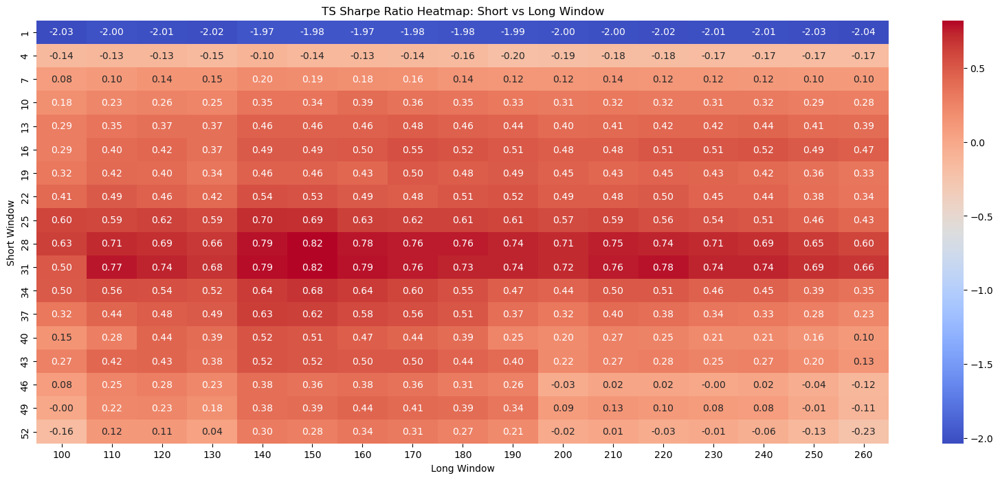

In [15]:
# Plot the heatmap
plt.figure(figsize=(20, 8))
sns.heatmap(sharpe_ratios.astype(float), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("TS Sharpe Ratio Heatmap: Short vs Long Window")
plt.xlabel("Long Window")
plt.ylabel("Short Window")
plt.show()

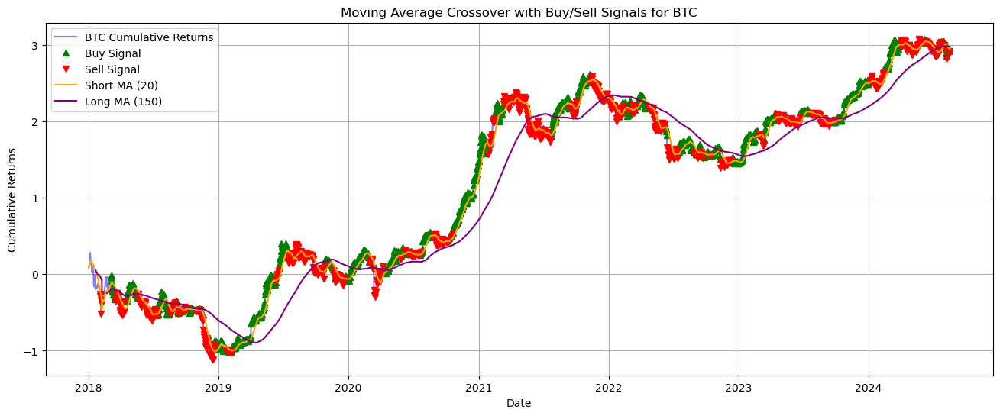

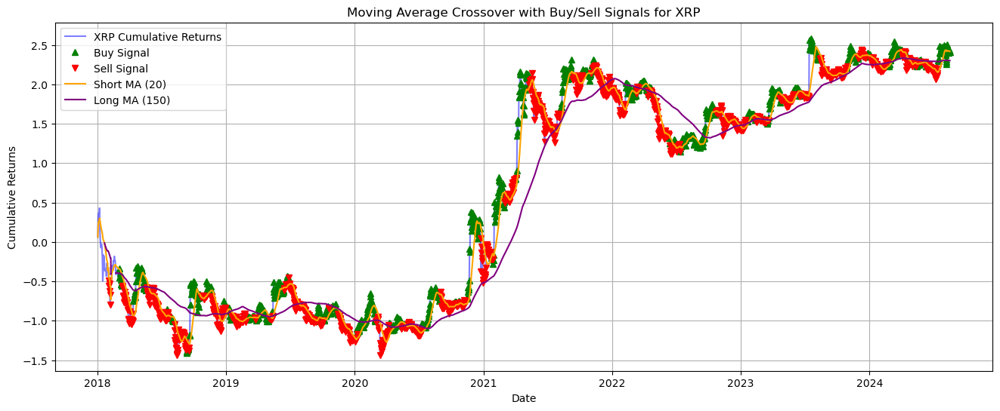

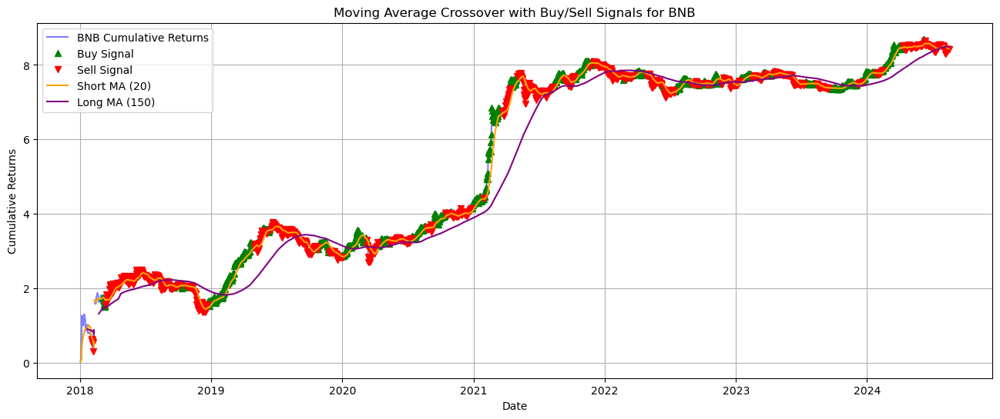

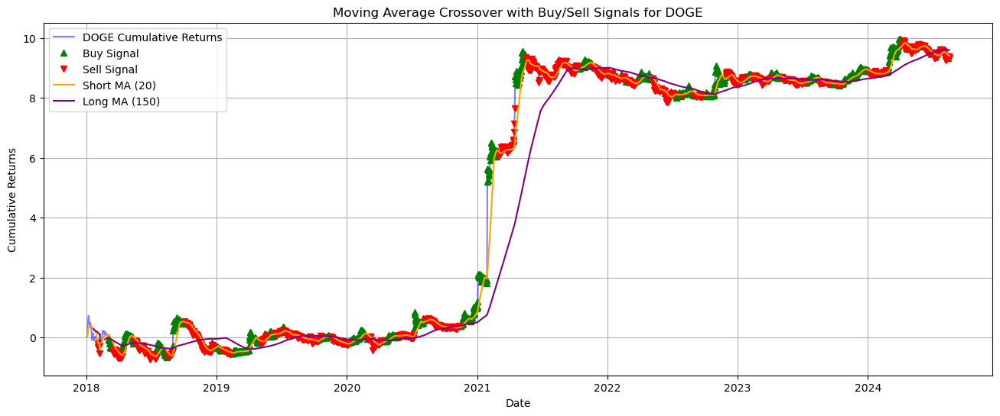

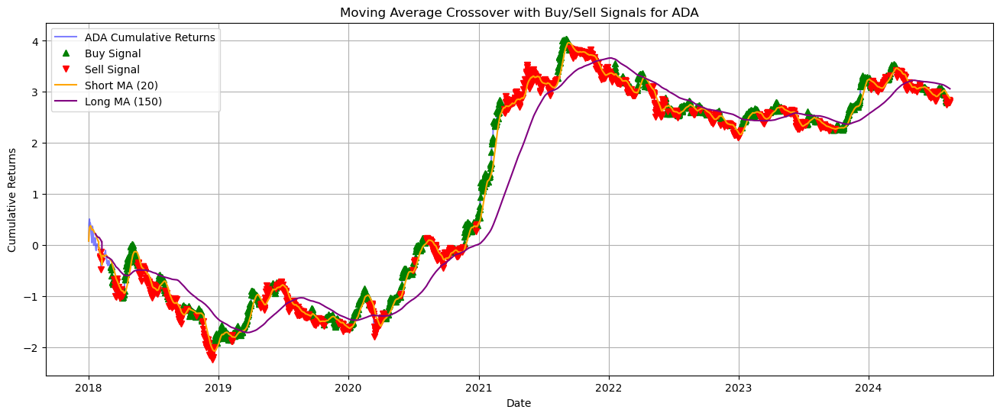

...

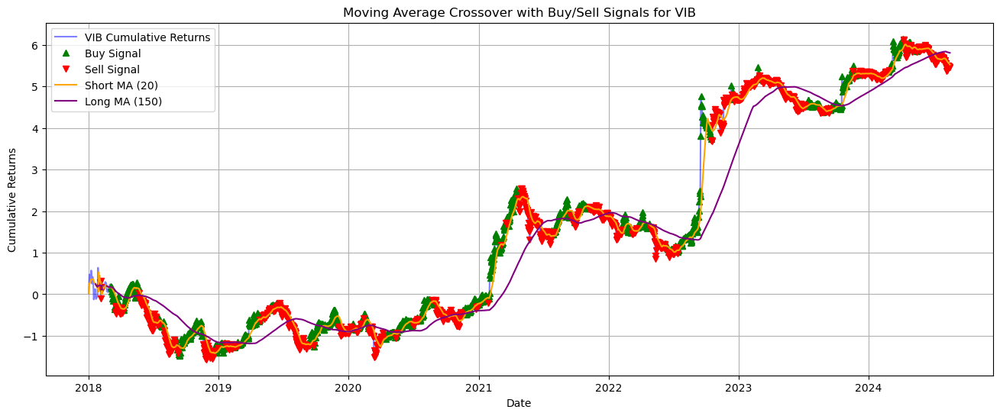

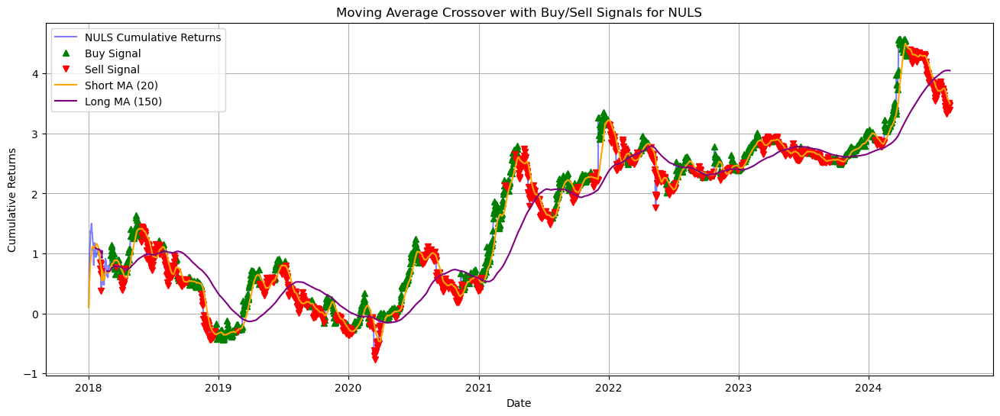

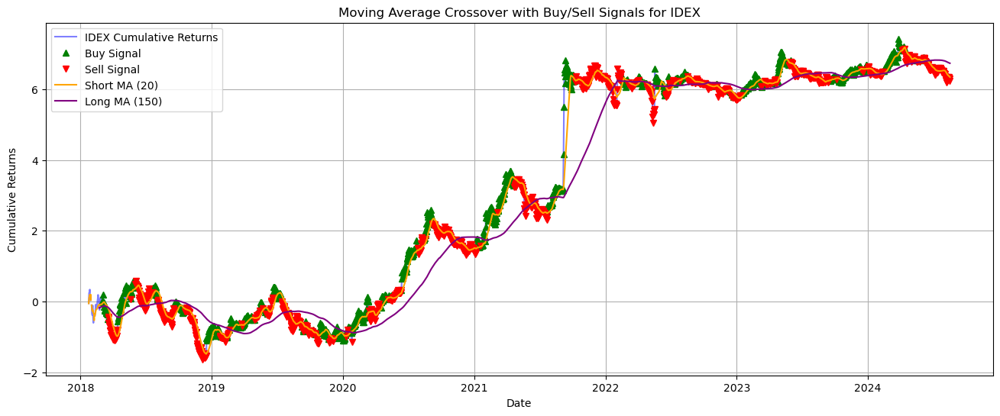

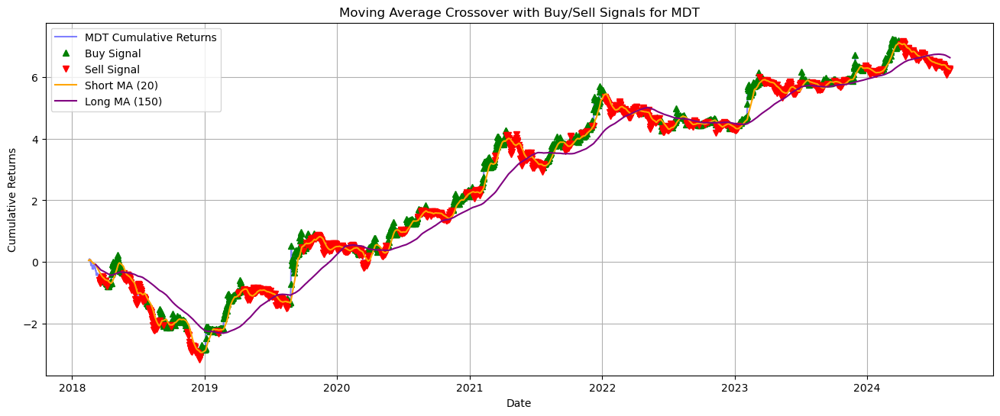

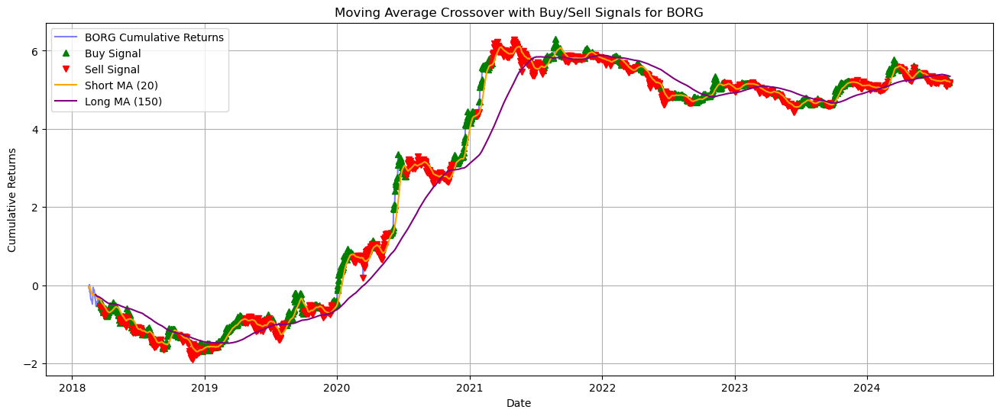

In [16]:
# full-of-sample tests
signal, port = generate_signals(coins_ret, 30, 160, 'TS')

for coin in coins_ret.columns:
    plot_signals(coins_ret, signal, 20, 150, coin)

In [17]:
strat_gross_ret = (port.shift()*coins_ret).sum(1)
            
# Net of transaction costs returns
to = compute_turnover(port)
tcost_bps = 20 # (commissions + slip)
strat_net_ret = strat_gross_ret.subtract(to * tcost_bps * 1e-4, fill_value=0)

print(f"The average turnover is {to.mean()}")
print(f"The holding period is {2/to.mean()} days")

The average turnover is 0.21255812321163217
The holding period is 9.409191094563402 days


In [18]:
full_sample_ret = pd.DataFrame({
    'ts_strat_ret': strat_net_ret,
    'buy_and_hold_btc': coins_ret['BTC']
})

full_sample_stats = compute_stats(full_sample_ret)
print(full_sample_stats)

                       avg       vol    sharpe  hit_rate
ts_strat_ret      0.285745  0.539472  0.529675  0.470016
buy_and_hold_btc  0.302132  0.564408  0.535307  0.515541


<Axes: xlabel='Date'>

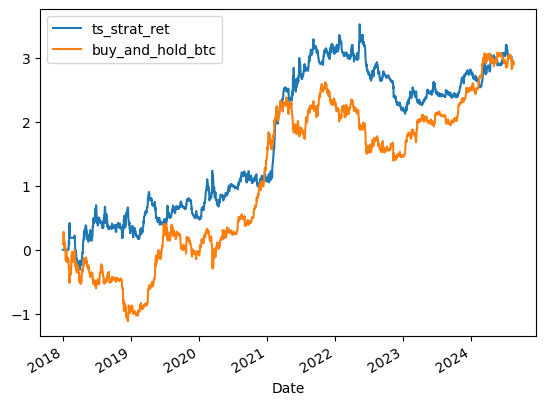

In [19]:
full_sample_ret.cumsum().plot()

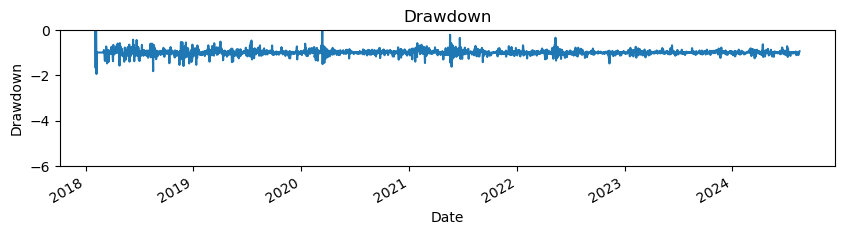

The max drawdown is -inf


In [20]:
# Plot drawdown
dd = drawdown(full_sample_ret['ts_strat_ret'])
plt.figure(figsize=(10, 2))
dd.plot()
plt.ylim(-6, 0)  # Set y-axis limits 
plt.title('Drawdown')
plt.xlabel('Date')
plt.ylabel('Drawdown')
plt.show()
print(f"The max drawdown is {dd.min()}")

XS Momentum in Cryptocurrencies

In [21]:
# Define the ranges for short and long windows
short_window_range = range(1, 53, 3) 
long_window_range = range(100, 266, 10)

# Initialize a DataFrame to store Sharpe ratios
sharpe_ratios = pd.DataFrame(index=short_window_range, columns=long_window_range)

# Calculate Sharpe ratios for each combination of short and long windows
for short_window in short_window_range:
    for long_window in long_window_range:
        signal, port = generate_signals(coins_ret, short_window, long_window, 'XS')
        strat_gross_ret = (port.shift()*coins_ret).sum(1)

        # Net of transaction costs returns
        to = compute_turnover(port)
        tcost_bps = 20 # (commissions + slip)
        strat_net_ret = strat_gross_ret.subtract(to * tcost_bps * 1e-4, fill_value=0)
        in_sample_ret = strat_net_ret.loc[:end_of_insample]

        sharpe_ratio = compute_sharpe_ratio(in_sample_ret)
        sharpe_ratios.loc[short_window, long_window] = sharpe_ratio

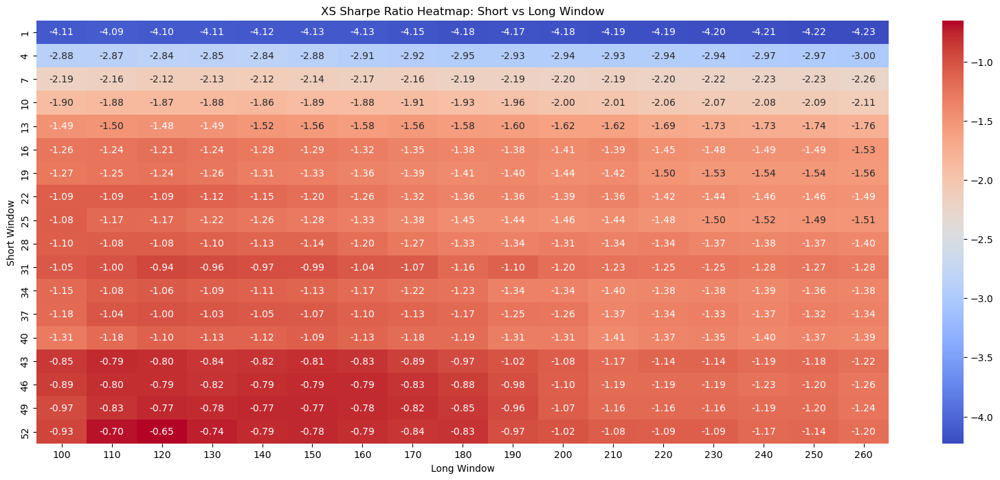

In [22]:
# Plot the heatmap
plt.figure(figsize=(20, 8))
sns.heatmap(sharpe_ratios.astype(float), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("XS Sharpe Ratio Heatmap: Short vs Long Window")
plt.xlabel("Long Window")
plt.ylabel("Short Window")
plt.show()

In [23]:
# out-of-sample tests
signal, port = generate_signals(coins_ret, 28, 180, 'XS')

strat_gross_ret = (port.shift()*coins_ret).sum(1)
            
# Net of transaction costs returns
to = compute_turnover(port)
tcost_bps = 20 # (commissions + slip)
strat_net_ret = strat_gross_ret.subtract(to * tcost_bps * 1e-4, fill_value=0)

print(f"The average turnover is {to.mean()}")
print(f"The holding period is {2/to.mean()} days")

The average turnover is 0.2386941160461533
The holding period is 8.378924596588234 days


In [24]:
full_sample_ret = pd.DataFrame({
    'xs_strat_ret': strat_net_ret,
    'buy_and_hold_btc': coins_ret['BTC']
})

full_sample_stats = compute_stats(full_sample_ret)
print(full_sample_stats)

                       avg       vol    sharpe  hit_rate
xs_strat_ret     -0.306587  0.178727 -1.715393  0.405374
buy_and_hold_btc  0.302132  0.564408  0.535307  0.515541


<Axes: xlabel='Date'>

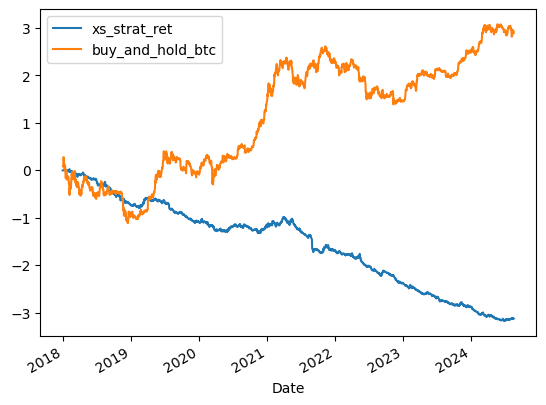

In [25]:
full_sample_ret.cumsum().plot()

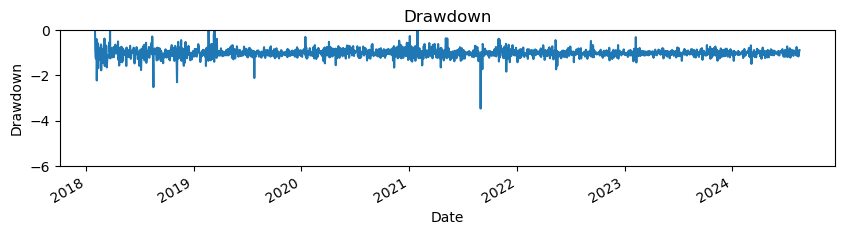

The max drawdown is -inf


In [26]:
# Plot drawdown
dd = drawdown(full_sample_ret['xs_strat_ret'])
plt.figure(figsize=(10, 2))
dd.plot()
plt.ylim(-6, 0)  # Set y-axis limits 
plt.title('Drawdown')
plt.xlabel('Date')
plt.ylabel('Drawdown')
plt.show()
print(f"The max drawdown is {dd.min()}")